In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import geopandas as gpd
from shapely.geometry import Point
import shapely.speedups
import folium
# import os




#profile report
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_excel('CFD_NFIRS_1_1_17to_6_25_21.xlsx')

In [3]:
df

,Incident Number,Incident Date,Basic Incident Hour Of Day 24,Incident Primary Action Taken,Apparatus Resource Actions Taken Code And Description 1,Apparatus Resource Arrival Date Time,Apparatus Resource Arrival Sequence Number By Overall Incident,Apparatus Resource On Scene Time in Minutes,Apparatus Resource Arrived To In Service In Minutes,Apparatus Resource Dispatch Date Time,...,Basic Property Use,Basic Property Use Code And Description,Basic Shift Or Platoon,Basic Incident Zone/District Number,Basic Fire Service Casualty Count,Basic Civilian Casualty Count,Basic Property Pre-Incident Value,Basic Property Losses,Basic Contents Pre-Incident Value,Basic Incident Total Losses
0,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,1 or 2 family dwelling,419 - 1 or 2 family dwelling,"""A"" Shift",NaN,0,0,NaN,NaN,NaN,NaN
1,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,1 or 2 family dwelling,419 - 1 or 2 family dwelling,"""A"" Shift",NaN,0,0,NaN,NaN,NaN,NaN
2,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,1 or 2 family dwelling,419 - 1 or 2 family dwelling,"""A"" Shift",NaN,0,0,NaN,NaN,NaN,NaN
3,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:17:22,2,NaN,NaN,2016-12-31 20:08:52,...,1 or 2 family dwelling,419 - 1 or 2 family dwelling,"""A"" Shift",NaN,0,0,NaN,NaN,NaN,NaN
4,2017-00000006,2017-01-01,1,Hazardous materials spill control and confinement,NaN,2017-01-01 01:50:46,1,NaN,10.50,2017-01-01 01:44:36,...,"Residential street, road or residential driveway","962 - Residential street, road or residential ...","""A"" Shift",Fifeville,0,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107723,2021-00005152,2021-06-25,19,Investigate,NaN,2021-06-25 19:27:28,2,NaN,4.73,2021-06-25 19:23:11,...,Hospital - medical or psychiatric,331 - Hospital - medical or psychiatric,"""C"" Shift",PZ 10,0,0,NaN,NaN,NaN,NaN
107724,2021-00005155,2021-06-25,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,Multifamily dwelling,429 - Multifamily dwelling,"""C"" Shift",PZ 5,0,0,NaN,NaN,NaN,NaN
107725,2021-00005155,2021-06-25,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,Multifamily dwelling,429 - Multifamily dwelling,"""C"" Shift",PZ 5,0,0,NaN,NaN,NaN,NaN
107726,2021-00005155,2021-06-25,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,Multifamily dwelling,429 - Multifamily dwelling,"""C"" Shift",PZ 5,0,0,NaN,NaN,NaN,NaN


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107728 entries, 0 to 107727
Data columns (total 50 columns):
 #   Column                                                          Non-Null Count   Dtype         
---  ------                                                          --------------   -----         
 0   Incident Number                                                 107728 non-null  object        
 1   Incident Date                                                   107728 non-null  datetime64[ns]
 2   Basic Incident Hour Of Day 24                                   107728 non-null  int64         
 3   Incident Primary Action Taken                                   106913 non-null  object        
 4   Apparatus Resource Actions Taken Code And Description 1         2938 non-null    object        
 5   Apparatus Resource Arrival Date Time                            107728 non-null  datetime64[ns]
 6   Apparatus Resource Arrival Sequence Number By Overall Incident  107728 non-n

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Basic Incident Hour Of Day 24,107728.0,1.295770e+01,6.100393e+00,0.000000,9.000000,13.000000,18.000000,2.300000e+01
Apparatus Resource Arrival Sequence Number By Overall Incident,107728.0,1.590905e+00,1.015250e+00,1.000000,1.000000,1.000000,2.000000,1.700000e+01
Apparatus Resource On Scene Time in Minutes,6712.0,1.610677e+01,8.758719e+00,0.020000,10.645000,15.120000,19.880000,2.143200e+02
Apparatus Resource Arrived To In Service In Minutes,105261.0,2.080817e+01,3.179118e+01,0.020000,6.280000,12.280000,27.550000,2.578500e+03
Incident Alarm Handling Time In Minutes,107728.0,1.527179e+00,1.067208e+00,0.020000,0.880000,1.230000,1.820000,1.000000e+01
Apparatus Resource Turnout Time In Minutes,107728.0,1.399714e+00,8.217579e-01,0.020000,0.930000,1.380000,1.830000,9.920000e+00
Apparatus Resource En Route To Arrived In Minutes,107728.0,3.842375e+00,2.237546e+00,0.020000,2.500000,3.450000,4.720000,3.012000e+01
Total Response Time,107728.0,6.769267e+00,2.591829e+00,0.270000,5.150000,6.350000,7.900000,3.626000e+01
Apparatus Personnel Hours Spent,25949.0,2.734248e-01,1.509930e+00,0.000000,0.000000,0.000000,0.400000,2.197400e+02
Apparatus Resource Dispatch To In Service In Minutes,105409.0,2.600573e+01,3.198581e+01,0.070000,11.330000,17.450000,32.750000,2.584080e+03


<function matplotlib.pyplot.show(close=None, block=None)>

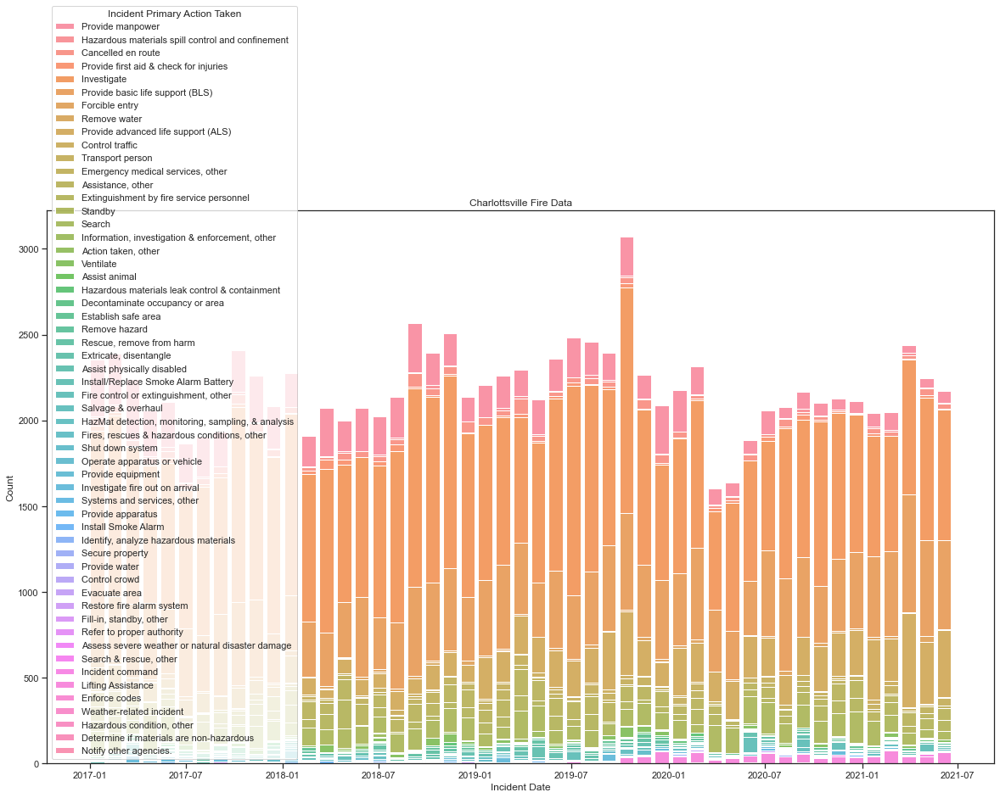

In [6]:
plt.figure(figsize=(20,12))
sns.set(style="ticks")

sns.histplot(data=df, x='Incident Date', hue='Incident Primary Action Taken', shrink=.8, multiple = 'stack').set(title = "Charlottsville Fire Data") #bins = years, hue="FireType", 

plt.show
#plt.savefig('CFD_Year_Plot.png')

In [7]:
#lets pull out a few other date features 

df['year'] = pd.DatetimeIndex(df['Incident Date']).year
df['month'] = pd.DatetimeIndex(df['Incident Date']).month
df['day'] = pd.DatetimeIndex(df['Incident Date']).day
df['dayofweek'] = pd.DatetimeIndex(df['Incident Date']).dayofweek #monday =0 sunday = 6

In [8]:
df.head()

,Incident Number,Incident Date,Basic Incident Hour Of Day 24,Incident Primary Action Taken,Apparatus Resource Actions Taken Code And Description 1,Apparatus Resource Arrival Date Time,Apparatus Resource Arrival Sequence Number By Overall Incident,Apparatus Resource On Scene Time in Minutes,Apparatus Resource Arrived To In Service In Minutes,Apparatus Resource Dispatch Date Time,...,Basic Fire Service Casualty Count,Basic Civilian Casualty Count,Basic Property Pre-Incident Value,Basic Property Losses,Basic Contents Pre-Incident Value,Basic Incident Total Losses,year,month,day,dayofweek
0,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6
1,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6
2,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6
3,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:17:22,2,NaN,NaN,2016-12-31 20:08:52,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6
4,2017-00000006,2017-01-01,1,Hazardous materials spill control and confinement,NaN,2017-01-01 01:50:46,1,NaN,10.50,2017-01-01 01:44:36,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6


Save our dataframe before converting to a geopandas dataframe.  Geopandas will not work with the profile report later.

In [9]:
df.to_csv('NFIRS.csv')

In [10]:
#this is how we can make make a geopandas df with our lat/long info.
#this function is strange to me as it takes long/lat, basically backward from how I think

#we've got 811 records with no lat long that will need to be fixed later

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Basic Incident Geocoded Longitude'], df['Basic Incident Geocoded Latitude']))
gdf

,Incident Number,Incident Date,Basic Incident Hour Of Day 24,Incident Primary Action Taken,Apparatus Resource Actions Taken Code And Description 1,Apparatus Resource Arrival Date Time,Apparatus Resource Arrival Sequence Number By Overall Incident,Apparatus Resource On Scene Time in Minutes,Apparatus Resource Arrived To In Service In Minutes,Apparatus Resource Dispatch Date Time,...,Basic Civilian Casualty Count,Basic Property Pre-Incident Value,Basic Property Losses,Basic Contents Pre-Incident Value,Basic Incident Total Losses,year,month,day,dayofweek,geometry
0,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.51782 38.01779)
1,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.51782 38.01779)
2,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.51782 38.01779)
3,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:17:22,2,NaN,NaN,2016-12-31 20:08:52,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.51782 38.01779)
4,2017-00000006,2017-01-01,1,Hazardous materials spill control and confinement,NaN,2017-01-01 01:50:46,1,NaN,10.50,2017-01-01 01:44:36,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.48845 38.02025)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107723,2021-00005152,2021-06-25,19,Investigate,NaN,2021-06-25 19:27:28,2,NaN,4.73,2021-06-25 19:23:11,...,0,NaN,NaN,NaN,NaN,2021,6,25,4,POINT (-78.49855 38.03103)
107724,2021-00005155,2021-06-25,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,0,NaN,NaN,NaN,NaN,2021,6,25,4,POINT (-78.48480 38.02985)
107725,2021-00005155,2021-06-25,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,0,NaN,NaN,NaN,NaN,2021,6,25,4,POINT (-78.48480 38.02985)
107726,2021-00005155,2021-06-25,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,0,NaN,NaN,NaN,NaN,2021,6,25,4,POINT (-78.48480 38.02985)


## Lets start making lat/long into neighborhood locations

![CFD Neigherborhood Map](hood_map.jpg)

Much of the following was derived from exmaples provided at https://automating-gis-processes.github.io/2017/index.html.  This is a fascinating open course from University of Helsinki.

In [11]:
#add kml support to gpd
gpd.io.file.fiona.drvsupport.supported_drivers['KML'] = 'rw'

In [12]:
#read the KML for cville provided by CFD.  It was inside a KMZ file and was extracted from the KMZ.

alb_cville_polys = gpd.read_file('doc.kml', driver='KML')
alb_cville_polys

,Name,Description,geometry
0,10th & Page,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.49092 38.03864 0.00000, ..."
1,UVA Fontaine,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.52320 38.02615 0.00000, ..."
2,Johnson Village,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.49682 38.01781 0.00000, ..."
3,Barracks / Rugby,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.48911 38.05672 0.00000, ..."
4,UVA International Residential College,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.50634 38.03960 0.00000, ..."
5,UVA Old Medical Grounds,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.49829 38.03337 0.00000, ..."
6,UVA,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.49691 38.03302 0.00000, ..."
7,Locust Grove,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.45856 38.03448 0.00000, ..."
8,Belmont,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.46963 38.01178 0.00000, ..."
9,Fry's Spring,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.50322 38.02426 0.00000, ..."


In [13]:
alb_cville_polys_dict = {}

In [14]:
for i in alb_cville_polys.index:
    hood = alb_cville_polys.Name[i]
    bound = alb_cville_polys.geometry[i]
    alb_cville_polys_dict[hood] = bound

In [15]:
alb_cville_polys_dict

{'10th & Page': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb3c490>,
 'UVA Fontaine': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb3c1c0>,
 'Johnson Village': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb3cfa0>,
 'Barracks / Rugby': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51b50>,
 'UVA International Residential College': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51d90>,
 'UVA Old Medical Grounds': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51790>,
 'UVA': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51c40>,
 'Locust Grove': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51760>,
 'Belmont': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51fa0>,
 "Fry's Spring": <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51a90>,
 'UVA Main Grounds': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51f40>,
 'Starr Hill': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51bb0>,
 'North Do

In [16]:
#While were here we'll map a set without the county to make the map smaller later

cville_polys = alb_cville_polys.drop([14])
cville_polys.reset_index(inplace = True)
cville_polys.drop(columns = 'index', axis = 1, inplace = True)
cville_polys

,Name,Description,geometry
0,10th & Page,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.49092 38.03864 0.00000, ..."
1,UVA Fontaine,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.52320 38.02615 0.00000, ..."
2,Johnson Village,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.49682 38.01781 0.00000, ..."
3,Barracks / Rugby,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.48911 38.05672 0.00000, ..."
4,UVA International Residential College,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.50634 38.03960 0.00000, ..."
5,UVA Old Medical Grounds,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.49829 38.03337 0.00000, ..."
6,UVA,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.49691 38.03302 0.00000, ..."
7,Locust Grove,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.45856 38.03448 0.00000, ..."
8,Belmont,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.46963 38.01178 0.00000, ..."
9,Fry's Spring,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...","MULTIPOLYGON Z (((-78.50322 38.02426 0.00000, ..."


In [17]:
cville_polys_dict = {}

In [18]:
for i in cville_polys.index:
    hood = alb_cville_polys.Name[i]
    bound = alb_cville_polys.geometry[i]
    cville_polys_dict[hood] = bound

In [19]:
cville_polys_dict

{'10th & Page': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb3c490>,
 'UVA Fontaine': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb3c1c0>,
 'Johnson Village': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb3cfa0>,
 'Barracks / Rugby': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51b50>,
 'UVA International Residential College': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51d90>,
 'UVA Old Medical Grounds': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51790>,
 'UVA': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51c40>,
 'Locust Grove': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51760>,
 'Belmont': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51fa0>,
 "Fry's Spring": <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51a90>,
 'UVA Main Grounds': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51f40>,
 'Starr Hill': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51bb0>,
 'North Do

Lets now make a function to put all of our points into a neigherborhood as defined in alb_cville_polys

In [20]:
# first attempt method, superseeded

# def test_loc(point):
#     if (point.within(alb_cville_polys.loc[0, 'geometry']) == True):
#         return alb_cville_polys.loc[0, 'Name']
#     elif (point.within(alb_cville_polys.loc[1, 'geometry']) == True):
#         return alb_cville_polys.loc[1, 'Name']
#     elif (point.within(alb_cville_polys.loc[2, 'geometry']) == True):
#         return alb_cville_polys.loc[2, 'Name']
#     elif (point.within(alb_cville_polys.loc[3, 'geometry']) == True):
#         return alb_cville_polys.loc[3, 'Name']
#     elif (point.within(alb_cville_polys.loc[4, 'geometry']) == True):
#         return alb_cville_polys.loc[4, 'Name']
#     elif (point.within(alb_cville_polys.loc[5, 'geometry']) == True):
#         return alb_cville_polys.loc[5, 'Name']
#     elif (point.within(alb_cville_polys.loc[6, 'geometry']) == True):
#         return alb_cville_polys.loc[6, 'Name']
#     elif (point.within(alb_cville_polys.loc[7, 'geometry']) == True):
#         return alb_cville_polys.loc[7, 'Name']
#     elif (point.within(alb_cville_polys.loc[8, 'geometry']) == True):
#         return alb_cville_polys.loc[8, 'Name']
#     elif (point.within(alb_cville_polys.loc[9, 'geometry']) == True):
#         return alb_cville_polys.loc[9, 'Name']
#     elif (point.within(alb_cville_polys.loc[10, 'geometry']) == True):
#         return alb_cville_polys.loc[10, 'Name']
#     elif (point.within(alb_cville_polys.loc[11, 'geometry']) == True):
#         return alb_cville_polys.loc[11, 'Name']
#     elif (point.within(alb_cville_polys.loc[12, 'geometry']) == True):
#         return alb_cville_polys.loc[12, 'Name']
#     elif (point.within(alb_cville_polys.loc[13, 'geometry']) == True):
#         return alb_cville_polys.loc[13, 'Name']
#     elif (point.within(alb_cville_polys.loc[14, 'geometry']) == True):
#         return alb_cville_polys.loc[14, 'Name']
#     elif (point.within(alb_cville_polys.loc[15, 'geometry']) == True):
#         return alb_cville_polys.loc[15, 'Name']
#     elif (point.within(alb_cville_polys.loc[17, 'geometry']) == True):
#         return alb_cville_polys.loc[17, 'Name']
#     elif (point.within(alb_cville_polys.loc[18, 'geometry']) == True):
#         return alb_cville_polys.loc[18, 'Name']
#     elif (point.within(alb_cville_polys.loc[19, 'geometry']) == True):
#         return alb_cville_polys.loc[19, 'Name']
#     elif (point.within(alb_cville_polys.loc[20, 'geometry']) == True):
#         return alb_cville_polys.loc[20, 'Name']
#     elif (point.within(alb_cville_polys.loc[21, 'geometry']) == True):
#         return alb_cville_polys.loc[21, 'Name']
#     elif (point.within(alb_cville_polys.loc[22, 'geometry']) == True):
#         return alb_cville_polys.loc[22, 'Name']
#     elif (point.within(alb_cville_polys.loc[23, 'geometry']) == True):
#         return alb_cville_polys.loc[23, 'Name']
#     elif (point.within(alb_cville_polys.loc[24, 'geometry']) == True):
#         return alb_cville_polys.loc[24, 'Name']
#     elif (point.within(alb_cville_polys.loc[25, 'geometry']) == True):
#         return alb_cville_polys.loc[25, 'Name']
#     elif (point.within(alb_cville_polys.loc[26, 'geometry']) == True):
#         return alb_cville_polys.loc[26, 'Name']
#     elif (point.within(alb_cville_polys.loc[27, 'geometry']) == True):
#         return alb_cville_polys.loc[27, 'Name']
#     elif (point.within(alb_cville_polys.loc[28, 'geometry']) == True):
#         return alb_cville_polys.loc[28, 'Name']
#     elif (point.within(alb_cville_polys.loc[20, 'geometry']) == True):
#         return alb_cville_polys.loc[29, 'Name']
#     else:
#         return 'Outside Albemarle County'

In [21]:
# gdf['Neigherborhood'] = gdf.geometry.apply(test_loc)

In [22]:
# take long/lat point from geopandas, test if that point is in each neigherborhod.

def lat_long_to_nhood(point):       
    if (point.within(alb_cville_polys_dict['10th & Page']) == True):
        return '10th & Page'
    elif (point.within(alb_cville_polys_dict['UVA Fontaine']) == True):
        return 'UVA Fontaine'
    elif (point.within(alb_cville_polys_dict['Johnson Village']) == True):
        return 'Johnson Village'
    elif (point.within(alb_cville_polys_dict['Barracks / Rugby']) == True):
        return 'Barracks / Rugby'
    elif (point.within(alb_cville_polys_dict['UVA International Residential College']) == True):
        return 'UVA International Residential College'
    elif (point.within(alb_cville_polys_dict['UVA Old Medical Grounds']) == True):
        return 'UVA Old Medical Grounds'
    elif (point.within(alb_cville_polys_dict['UVA']) == True):
        return 'UVA'
    elif (point.within(alb_cville_polys_dict['Locust Grove']) == True):
        return 'Locust Grove'
    elif (point.within(alb_cville_polys_dict['Belmont']) == True):
        return 'Belmont'
    elif (point.within(alb_cville_polys_dict["Fry's Spring"]) == True):
        return "Fry's Spring"
    elif (point.within(alb_cville_polys_dict['UVA Main Grounds']) == True):
        return 'UVA Main Grounds'
    elif (point.within(alb_cville_polys_dict['Starr Hill']) == True):
        return 'Starr Hill'
    elif (point.within(alb_cville_polys_dict['North Downtown']) == True):
        return 'North Downtown'
    elif (point.within(alb_cville_polys_dict['Barracks Road']) == True):
        return 'Barracks Road'
    elif (point.within(alb_cville_polys_dict['Albemarle County']) == True):
        return 'Albemarle County'
    elif (point.within(alb_cville_polys_dict['Rose Hill']) == True):
        return 'Rose Hill'
    elif (point.within(alb_cville_polys_dict['UVA Ivy']) == True):
        return 'UVA Ivy'
    elif (point.within(alb_cville_polys_dict['UVA Piedmont Faculty']) == True):
        return 'UVA Piedmont Faculty'
    elif (point.within(alb_cville_polys_dict['UVA Carruthers Hall']) == True):
        return 'UVA Carruthers Hall'
    elif (point.within(alb_cville_polys_dict['Venable']) == True):
        return 'Venable'
    elif (point.within(alb_cville_polys_dict['Ridge Street']) == True):
        return 'Ridge Street'
    elif (point.within(alb_cville_polys_dict['Fifeville']) == True):
        return 'Fifeville'
    elif (point.within(alb_cville_polys_dict['Jefferson Park Avenue']) == True):
        return 'Jefferson Park Avenue'
    elif (point.within(alb_cville_polys_dict['UVA Darden/Law/JPJ']) == True):
        return 'UVA Darden/Law/JPJ'
    elif (point.within(alb_cville_polys_dict['Lewis Mountain']) == True):
        return 'Lewis Mountain'
    elif (point.within(alb_cville_polys_dict['The Meadows']) == True):
        return 'The Meadows'
    elif (point.within(alb_cville_polys_dict['UVA Lambeth']) == True):
        return 'UVA Lambeth'
    elif (point.within(alb_cville_polys_dict['Greenbrier']) == True):
        return 'Greenbrier'
    elif (point.within(alb_cville_polys_dict['Woolen Mills']) == True):
        return 'Woolen Mills'
    elif (point.within(alb_cville_polys_dict['Martha Jefferson']) == True):
        return 'Martha Jefferson'
    else:
        return 'Outside Albemarle County'

In [23]:
gdf['Neighborhood'] = gdf.geometry.apply(lat_long_to_nhood)

In [24]:
gdf

,Incident Number,Incident Date,Basic Incident Hour Of Day 24,Incident Primary Action Taken,Apparatus Resource Actions Taken Code And Description 1,Apparatus Resource Arrival Date Time,Apparatus Resource Arrival Sequence Number By Overall Incident,Apparatus Resource On Scene Time in Minutes,Apparatus Resource Arrived To In Service In Minutes,Apparatus Resource Dispatch Date Time,...,Basic Property Pre-Incident Value,Basic Property Losses,Basic Contents Pre-Incident Value,Basic Incident Total Losses,year,month,day,dayofweek,geometry,Neighborhood
0,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.51782 38.01779),Fry's Spring
1,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.51782 38.01779),Fry's Spring
2,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.51782 38.01779),Fry's Spring
3,2016-00006845,2017-01-01,20,Provide manpower,NaN,2016-12-31 20:17:22,2,NaN,NaN,2016-12-31 20:08:52,...,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.51782 38.01779),Fry's Spring
4,2017-00000006,2017-01-01,1,Hazardous materials spill control and confinement,NaN,2017-01-01 01:50:46,1,NaN,10.50,2017-01-01 01:44:36,...,NaN,NaN,NaN,NaN,2017,1,1,6,POINT (-78.48845 38.02025),Ridge Street
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107723,2021-00005152,2021-06-25,19,Investigate,NaN,2021-06-25 19:27:28,2,NaN,4.73,2021-06-25 19:23:11,...,NaN,NaN,NaN,NaN,2021,6,25,4,POINT (-78.49855 38.03103),UVA
107724,2021-00005155,2021-06-25,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,NaN,NaN,NaN,NaN,2021,6,25,4,POINT (-78.48480 38.02985),North Downtown
107725,2021-00005155,2021-06-25,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,NaN,NaN,NaN,NaN,2021,6,25,4,POINT (-78.48480 38.02985),North Downtown
107726,2021-00005155,2021-06-25,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,NaN,NaN,NaN,NaN,2021,6,25,4,POINT (-78.48480 38.02985),North Downtown


In [25]:
gdf.Neighborhood.value_counts()

North Downtown                           12276
Belmont                                  10189
The Meadows                               7779
Fifeville                                 7658
Venable                                   7113
Ridge Street                              6941
UVA Main Grounds                          5678
UVA                                       5297
Fry's Spring                              5012
Albemarle County                          4632
10th & Page                               4114
Martha Jefferson                          3749
Locust Grove                              2916
Starr Hill                                2888
Greenbrier                                2574
Barracks / Rugby                          2394
Woolen Mills                              2141
Jefferson Park Avenue                     2029
Rose Hill                                 2026
Barracks Road                             1815
UVA Old Medical Grounds                   1519
UVA Darden/La

Now we can plot all our data

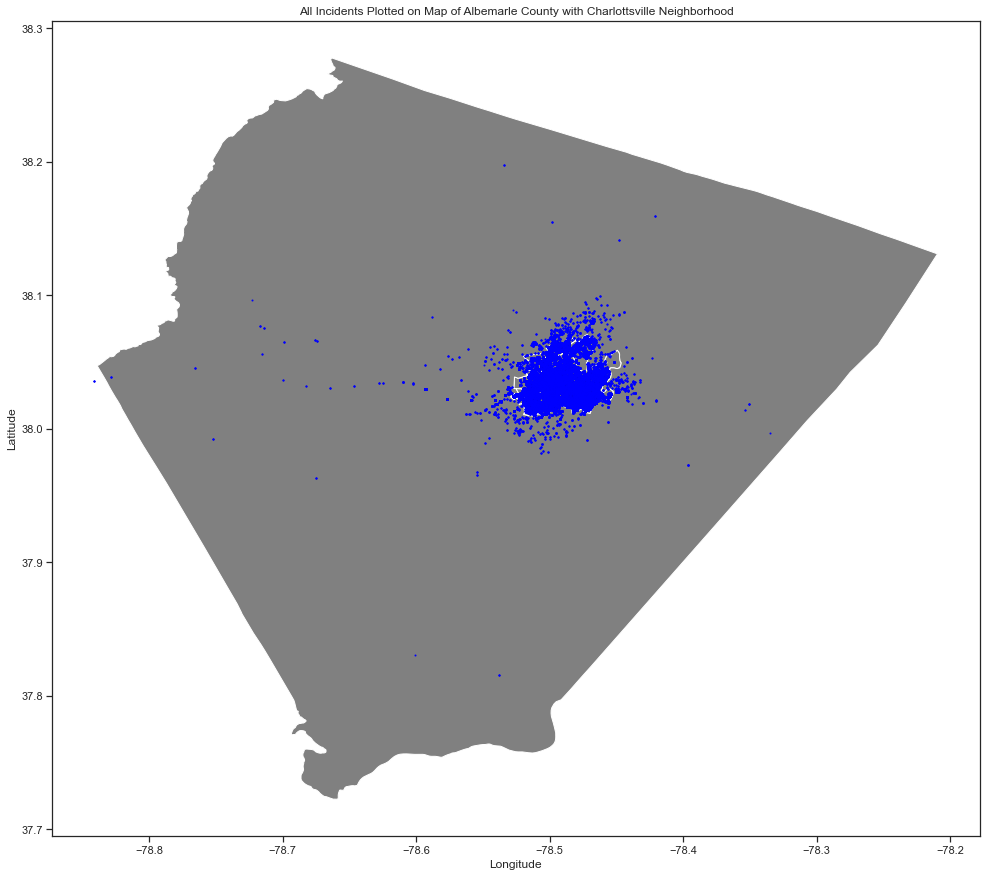

In [26]:
#all the only works on a GEOPANDAS DF, not a regular pandas DF

# nhood = polys3[alb_cville_polys['Name']=='Venable'] #this allows you to select a neigherborhood
# nood.reset_index(drop=True, inplace=True)
fig, ax = plt.subplots(figsize=(20, 15)) #start the plot
alb_cville_polys.plot(ax=ax, facecolor='gray');
# cville.plot(ax=ax, facecolor='red'); #plot a neighborhood in a contrasting color
gdf.plot(ax=ax, color='blue', markersize=1); # plot points on map
# Add title and axis names
plt.title('All Incidents Plotted on Map of Albemarle County with Charlottsville Neighborhood')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
# plt.tight_layout();
plt.savefig('inident_map.png')

Or we can plot just a neigherborhod

In [27]:
north_downtown_points = gdf.within(cville_polys_dict['North Downtown'])

In [28]:
north_downtown_points.value_counts()

False    95452
True     12276
dtype: int64

In [29]:
north_downtown_data = gdf.loc[north_downtown_points]

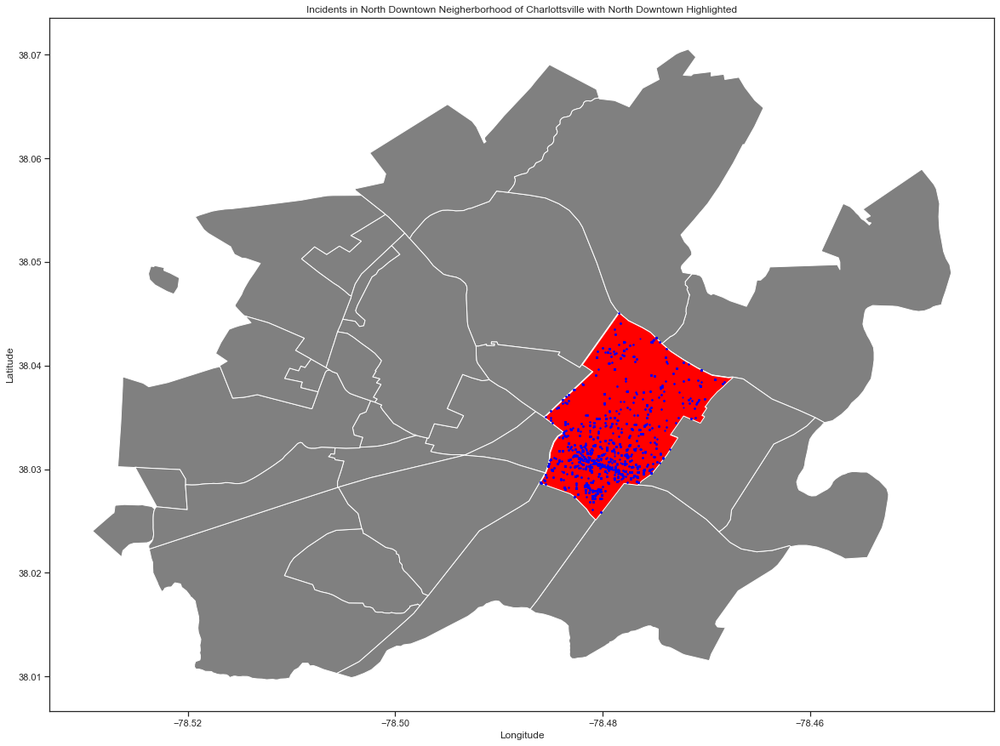

In [30]:
nhood = cville_polys[cville_polys['Name']=='North Downtown'] #this allows you to select a neigherborhood
nhood.reset_index(drop=True, inplace=True)
fig, ax = plt.subplots(figsize=(20, 15)) #start the plot
cville_polys.plot(ax=ax, facecolor='gray');
nhood.plot(ax=ax, facecolor='red'); #plot a neighborhood in a contrasting color
north_downtown_data.plot(ax=ax, color='blue', markersize=1); # plot points on map
# Add title and axis names
plt.title('Incidents in North Downtown Neigherborhood of Charlottsville with North Downtown Highlighted')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
# plt.tight_layout();
plt.savefig('inident_map_north_downtown.png')
# plt.tight_layout();

Or just the neigherborhood

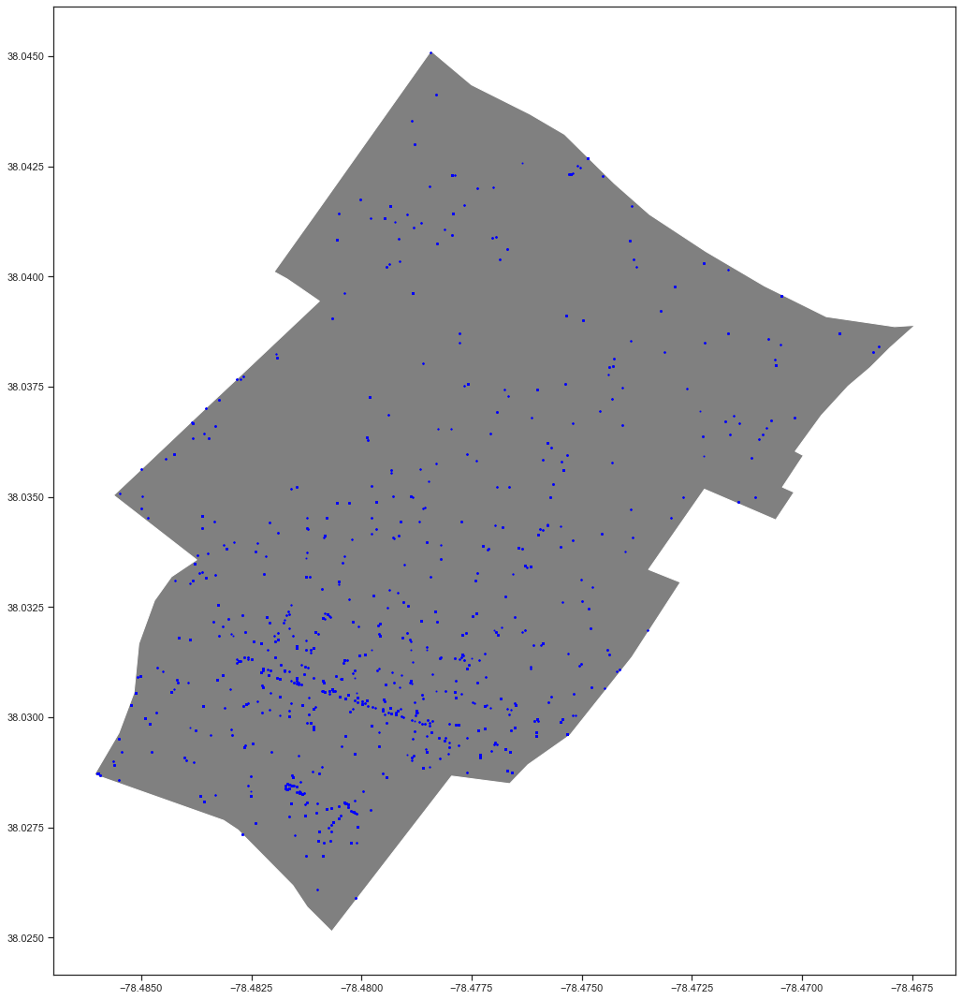

In [31]:
nhood = cville_polys[cville_polys['Name']=='North Downtown'] #this allows you to select a neigherborhood
nhood.reset_index(drop=True, inplace=True)
fig, ax = plt.subplots(figsize=(20, 15)) #start the plot
# figsize=(20, 15)
# cville_polys.plot(ax=ax, facecolor='gray');
nhood.plot(ax = ax, facecolor='grey'); #plot a neighborhood in a contrasting color
north_downtown_data.plot(ax = ax, color='blue', markersize=1); # plot points on map
plt.tight_layout();

In [32]:
alb_cville_polys_dict

{'10th & Page': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb3c490>,
 'UVA Fontaine': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb3c1c0>,
 'Johnson Village': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb3cfa0>,
 'Barracks / Rugby': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51b50>,
 'UVA International Residential College': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51d90>,
 'UVA Old Medical Grounds': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51790>,
 'UVA': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51c40>,
 'Locust Grove': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51760>,
 'Belmont': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51fa0>,
 "Fry's Spring": <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51a90>,
 'UVA Main Grounds': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51f40>,
 'Starr Hill': <shapely.geometry.multipolygon.MultiPolygon at 0x1f16eb51bb0>,
 'North Do

In [33]:
Outside_Albemarle_County_points = gdf[gdf['Neighborhood'] == 'Outside Albemarle County'].copy()

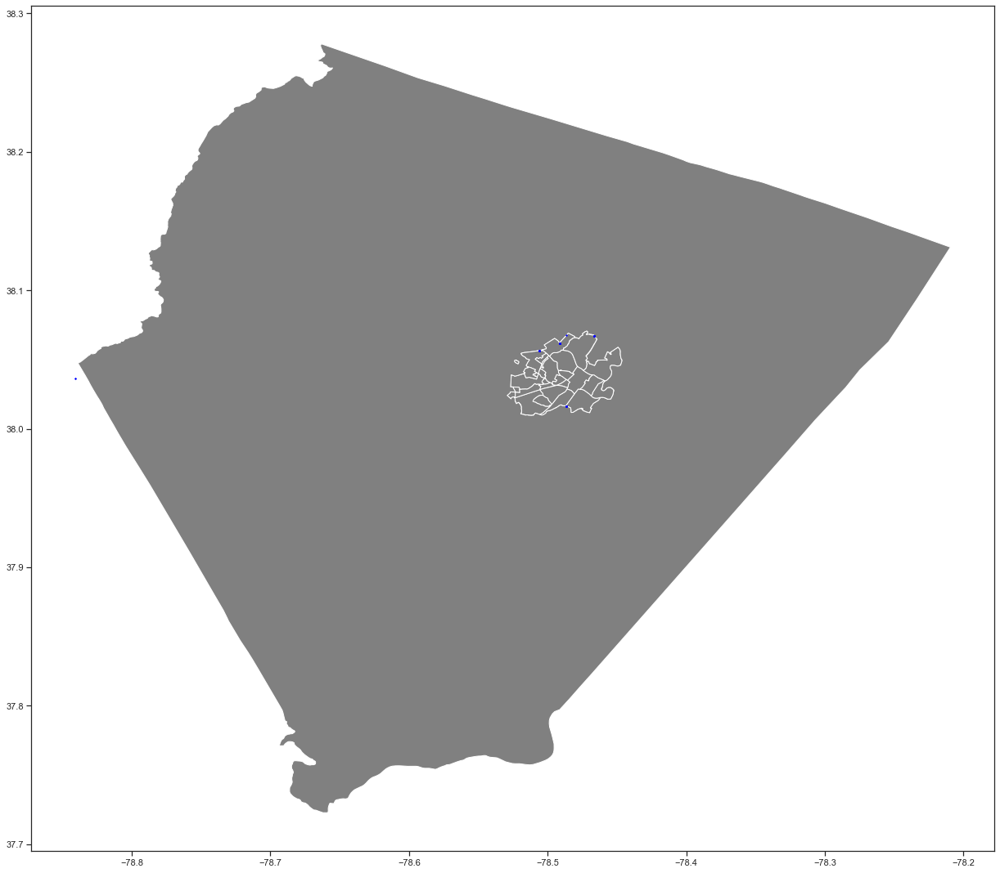

In [34]:
# nhood = cville_polys[cville_polys['Name']=='North Downtown'] #this allows you to select a neigherborhood
# nhood.reset_index(drop=True, inplace=True)
fig, ax = plt.subplots(figsize=(20, 15)) #start the plot
alb_cville_polys.plot(ax=ax, facecolor='gray');
# nhood.plot(ax=ax, facecolor='red'); #plot a neighborhood in a contrasting color
Outside_Albemarle_County_points.plot(ax=ax, color='blue', markersize=1); # plot points on map
plt.tight_layout();

some of those look to be in Charlottsville... lets put them in another map...

From IBM Vis class I took last winter on EdX

In [35]:
# define the world map centered around UVA with a low zoom level
cvillemap = folium.Map(location=[38.0293, -78.4767], zoom_start=12, width='80%', height='80%')

# display map
cvillemap

Lets make our life simpler to plot and drop the duplicate locations (data has locations for each CFD personnel involved)

In [36]:
gdf.shape

(107728, 56)

In [37]:
gdf_locations = gdf.drop_duplicates(subset = ['Basic Incident Geocoded Latitude', 'Basic Incident Geocoded Longitude'])

In [38]:
gdf_locations.shape

(7886, 56)

In [39]:
#this function will NOT accept NaN for location added try/except to pass on NaN

# instantiate a feature group for the incidents in the dataframe
# folium uses feature groups to add points to the map
incidents = folium.map.FeatureGroup()

#this takes data order of lat long, not long lat like earlier

# loop through the points and add each to the incidents feature group
for lat, lng in zip(gdf_locations['Basic Incident Geocoded Latitude'], gdf_locations['Basic Incident Geocoded Longitude']):
    try:
        incidents.add_child(
            folium.features.CircleMarker(
                [lat, lng],
                radius=3, # define how big you want the circle markers to be
                color='red',
                fill=True,
                fill_color='blue',
                fill_opacity=0.6))
    except:
        pass

In [40]:
# add incidents to map
cvillemap.add_child(incidents)

any really strange locations?

In [41]:
world_map = folium.Map(width='80%', height='80%')

world_map.add_child(incidents)

Looks like all the data is only in the greater Charlottsville area.

In [42]:
Outside_Albemarle_County_points

,Incident Number,Incident Date,Basic Incident Hour Of Day 24,Incident Primary Action Taken,Apparatus Resource Actions Taken Code And Description 1,Apparatus Resource Arrival Date Time,Apparatus Resource Arrival Sequence Number By Overall Incident,Apparatus Resource On Scene Time in Minutes,Apparatus Resource Arrived To In Service In Minutes,Apparatus Resource Dispatch Date Time,...,Basic Property Pre-Incident Value,Basic Property Losses,Basic Contents Pre-Incident Value,Basic Incident Total Losses,year,month,day,dayofweek,geometry,Neighborhood
157,2017-00000097,2017-01-04,15,Provide basic life support (BLS),NaN,2017-01-04 15:36:28,1,5.57,32.48,2017-01-04 15:31:34,...,NaN,NaN,NaN,NaN,2017,1,4,2,POINT (nan nan),Outside Albemarle County
158,2017-00000097,2017-01-04,15,Provide basic life support (BLS),NaN,2017-01-04 15:36:28,1,5.57,32.48,2017-01-04 15:31:34,...,NaN,NaN,NaN,NaN,2017,1,4,2,POINT (nan nan),Outside Albemarle County
900,2017-00000420,2017-01-14,18,Investigate,NaN,2017-01-14 18:48:55,1,NaN,11.48,2017-01-14 18:44:04,...,NaN,NaN,NaN,NaN,2017,1,14,5,POINT (nan nan),Outside Albemarle County
901,2017-00000420,2017-01-14,18,Investigate,NaN,2017-01-14 18:48:55,1,NaN,11.48,2017-01-14 18:44:04,...,NaN,NaN,NaN,NaN,2017,1,14,5,POINT (nan nan),Outside Albemarle County
902,2017-00000420,2017-01-14,18,Investigate,NaN,2017-01-14 18:48:55,1,NaN,11.48,2017-01-14 18:44:04,...,NaN,NaN,NaN,NaN,2017,1,14,5,POINT (nan nan),Outside Albemarle County
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106883,2021-00004801,2021-06-14,13,Extinguishment by fire service personnel,73 - Provide manpower,2021-06-14 13:14:24,5,NaN,57.75,2021-06-14 13:12:19,...,10000.0,10000.0,2000.0,12000.0,2021,6,14,0,POINT (nan nan),Outside Albemarle County
106884,2021-00004801,2021-06-14,13,Extinguishment by fire service personnel,73 - Provide manpower,2021-06-14 13:14:24,5,NaN,57.75,2021-06-14 13:12:19,...,10000.0,10000.0,2000.0,12000.0,2021,6,14,0,POINT (nan nan),Outside Albemarle County
106885,2021-00004801,2021-06-14,13,Extinguishment by fire service personnel,73 - Provide manpower,2021-06-14 13:14:24,5,NaN,57.75,2021-06-14 13:12:19,...,323100.0,5000.0,0.0,5000.0,2021,6,14,0,POINT (nan nan),Outside Albemarle County
106886,2021-00004801,2021-06-14,13,Extinguishment by fire service personnel,73 - Provide manpower,2021-06-14 13:14:24,5,NaN,57.75,2021-06-14 13:12:19,...,323100.0,5000.0,0.0,5000.0,2021,6,14,0,POINT (nan nan),Outside Albemarle County


In [43]:
Outside_Albemarle_County_points['Basic Incident Geocoded Latitude'].isna().sum()

811

In [44]:
Outside_Albemarle_County_points.shape

(886, 56)

In [45]:
Outside_Albemarle_County_points.drop(columns = ['Apparatus Personnel Full Name', 'Apparatus Personnel Role'], axis = 1, inplace = True)

In [46]:
Outside_Albemarle_County_points.drop_duplicates(subset = ['Basic Incident Full Address', 'Apparatus Resource ID'], inplace = True)

In [47]:
Outside_Albemarle_County_points.shape

(346, 54)

In [48]:
Outside_Albemarle_County_points[['Basic Incident Type Category']].value_counts()

Basic Incident Type Category                           
3 - Rescue & Emergency Medical Service Incident            272
1 - Fire                                                    30
7 - False Alarm & False Call                                17
6 - Good Intent Call                                        16
4 - Hazardous Condition (No Fire)                            8
2 - Overpressure Rupture, Explosion, Overheat (No Fire)      2
5 - Service Call                                             1
dtype: int64

In [49]:
Outside_Albemarle_County_points[['year']].value_counts()

year
2018    143
2019    130
2017     49
2020     12
2021     12
dtype: int64

In [50]:
Outside_Albemarle_County_points[['Apparatus Resource ID']].value_counts().to_frame()

,0
Apparatus Resource ID,
RSFM10,81
RS143,50
RS140,47
E10,28
E5,24
E1,24
E7,21
TO10,11
BC1,7


In [51]:
Outside_Albemarle_County_points[['Apparatus Resource ID', 'year']].value_counts().to_frame()

0
Apparatus Resource ID year    
RSFM10                2019  44
                      2018  36
RS140                 2018  35
RS143                 2019  26
                      2018  24
...                         ..
RS144                 2018   1
FM10                  2018   1
FM2                   2020   1
BC1                   2018   1
Truck 9               2017   1

[65 rows x 1 columns]

In [52]:
Outside_Albemarle_County_points[Outside_Albemarle_County_points['Apparatus Resource ID'] == 'RSFM10']['Apparatus Resource Type']

26458    Rescue unit
31797    Rescue unit
34953    Rescue unit
35354    Rescue unit
35451    Rescue unit
            ...     
67663       ALS unit
68543       ALS unit
69120       ALS unit
69977       ALS unit
91285       ALS unit
Name: Apparatus Resource Type, Length: 81, dtype: object

In [53]:
Outside_Albemarle_County_points[Outside_Albemarle_County_points['Apparatus Resource ID'] == 'RS140']['Apparatus Resource Type']

21966       ALS unit
29033       ALS unit
30357       ALS unit
30991       ALS unit
35405       ALS unit
35785       ALS unit
35882       ALS unit
35888       ALS unit
35891       ALS unit
35907       ALS unit
36010       ALS unit
36018       ALS unit
38013       ALS unit
38015       ALS unit
38203       ALS unit
38205       ALS unit
38211       ALS unit
38377       ALS unit
38392    Rescue unit
38651       ALS unit
38831       ALS unit
38852       ALS unit
38884       ALS unit
38887       ALS unit
38943       ALS unit
39376       ALS unit
39450    Rescue unit
39576    Rescue unit
39579       ALS unit
43826       ALS unit
45460       ALS unit
45854       ALS unit
45867       ALS unit
47310       ALS unit
47848       ALS unit
48018       ALS unit
48716       ALS unit
49096       ALS unit
49496       ALS unit
50003       ALS unit
50018       ALS unit
50035       ALS unit
50613       ALS unit
50637       ALS unit
50646       ALS unit
51236       ALS unit
51277       ALS unit
Name: Apparat

In [54]:
oac_app = Outside_Albemarle_County_points[['Apparatus Resource ID', 'Apparatus Resource Type', 'year']]
oac_app

,Apparatus Resource ID,Apparatus Resource Type,year
157,RS142,ALS unit,2017
900,E10,Engine,2017
903,TO10,Quint,2017
1693,RS145,ALS unit,2017
2144,E10,Engine,2017
...,...,...,...
106875,RES1,Chief officer car,2021
106876,SQ10,Engine,2021
106879,SQ10,Engine,2021
106882,TO10,Quint,2021


In [55]:
oac_app.value_counts().to_frame()

0
Apparatus Resource ID Apparatus Resource Type year    
RSFM10                Rescue unit             2018  35
                      ALS unit                2019  33
RS140                 ALS unit                2018  32
RS143                 ALS unit                2019  26
                                              2018  18
...                                                 ..
RS144                 ALS unit                2019   1
                      BLS unit                2019   1
RS145                 ALS unit                2018   1
RS146                 ALS unit                2018   1
Truck 9               Truck or aerial         2017   1

[73 rows x 1 columns]

In [56]:
oac_app[['Apparatus Resource ID', 'Apparatus Resource Type']].value_counts().to_frame()

,,0
Apparatus Resource ID,Apparatus Resource Type,
RSFM10,Rescue unit,46
RS140,ALS unit,44
RS143,ALS unit,44
RSFM10,ALS unit,35
E10,Engine,28
E1,Engine,24
E5,Engine,24
E7,Engine,21
TO10,Quint,11


In [57]:
oac_app[['Apparatus Resource Type', 'year']].value_counts().to_frame()

0
Apparatus Resource Type      year    
ALS unit                     2019  74
                             2018  54
Rescue unit                  2018  41
Engine                       2019  36
                             2018  35
                             2017  27
Rescue unit                  2019  11
ALS unit                     2017   8
Engine                       2020   6
Chief officer car            2021   4
Truck or aerial              2017   4
Engine                       2021   4
Other apparatus/resource     2017   4
Quint                        2017   4
                             2018   4
Medical & rescue unit, other 2018   3
Truck or aerial              2018   3
ALS unit                     2020   3
Quint                        2019   2
Rescue unit                  2017   2
Quint                        2021   2
Other apparatus/resource     2018   2
                             2021   2
                             2019   2
Chief officer car            2019   2
BLS unit                     2019   2
Other apparatus/resource     2020   1
Chief officer car            2020   1
Support apparatus, other     2018   1
Truck or aerial              2019   1
                             2020   1

In [58]:
#this function will NOT accept NaN for location added try/except to pass on NaN

# instantiate a feature group for the incidents in the dataframe
# folium uses feature groups to add points to the map
incidents_outside_albemarle_county = folium.map.FeatureGroup()

#this takes data order of lat long, not long lat like earlier

# loop through the points and add each to the incidents feature group
for lat, lng in zip(Outside_Albemarle_County_points['Basic Incident Geocoded Latitude'], Outside_Albemarle_County_points['Basic Incident Geocoded Longitude']):
    try:
        incidents_outside_albemarle_county.add_child(
            folium.features.CircleMarker(
                [lat, lng],
                radius=3, # define how big you want the circle markers to be
                color='red',
                fill=True,
                fill_color='blue',
                fill_opacity=0.6))
    except:
        pass

In [59]:
# define the world map centered around UVA with a low zoom level
cvillemap_outside = folium.Map(location=[38.0293, -78.4767], zoom_start=12, width='80%', height='80%')


# add incidents to map
cvillemap_outside.add_child(incidents_outside_albemarle_county)

In [60]:
856/107728 

0.0079459379177187

Under close inspection, it apears that the majority of these incidents are those without geocodes (811 of 856).  As these represent less than 1% of our data, we should exclude them rather than doing the time and potential expense of geocoding them.  It also appears that the majority of those are from Resuce Squad, and from 2018 and 2019.  Was there a change in equipment in rescue squad?  Are there more vehicles equipped with Automatic GPS?

In [61]:
#get rid of big df geopandas breaks it when it converts it.
try:
    del(df) #we'll get rid of the big dataset
    print('Original df deleted')
except: 
    print('Original df already deleted')

Original df deleted


In [62]:
df = pd.read_csv('NFIRS.csv') #the reads in a hell of a lot quicker than the original excel
try:
    df.drop(columns = 'Unnamed: 0', axis = 1, inplace = True)
    print("Loaded and got rid of duplicate index")
except: 
    print('Loaded')

Loaded and got rid of duplicate index


In [63]:
df

,Incident Number,Incident Date,Basic Incident Hour Of Day 24,Incident Primary Action Taken,Apparatus Resource Actions Taken Code And Description 1,Apparatus Resource Arrival Date Time,Apparatus Resource Arrival Sequence Number By Overall Incident,Apparatus Resource On Scene Time in Minutes,Apparatus Resource Arrived To In Service In Minutes,Apparatus Resource Dispatch Date Time,...,Basic Fire Service Casualty Count,Basic Civilian Casualty Count,Basic Property Pre-Incident Value,Basic Property Losses,Basic Contents Pre-Incident Value,Basic Incident Total Losses,year,month,day,dayofweek
0,2016-00006845,2017-01-01 00:00:00,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6
1,2016-00006845,2017-01-01 00:00:00,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6
2,2016-00006845,2017-01-01 00:00:00,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6
3,2016-00006845,2017-01-01 00:00:00,20,Provide manpower,NaN,2016-12-31 20:17:22,2,NaN,NaN,2016-12-31 20:08:52,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6
4,2017-00000006,2017-01-01 00:00:00,1,Hazardous materials spill control and confinement,NaN,2017-01-01 01:50:46,1,NaN,10.50,2017-01-01 01:44:36,...,0,0,NaN,NaN,NaN,NaN,2017,1,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107723,2021-00005152,2021-06-25 00:00:00,19,Investigate,NaN,2021-06-25 19:27:28,2,NaN,4.73,2021-06-25 19:23:11,...,0,0,NaN,NaN,NaN,NaN,2021,6,25,4
107724,2021-00005155,2021-06-25 00:00:00,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,0,0,NaN,NaN,NaN,NaN,2021,6,25,4
107725,2021-00005155,2021-06-25 00:00:00,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,0,0,NaN,NaN,NaN,NaN,2021,6,25,4
107726,2021-00005155,2021-06-25 00:00:00,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,0,0,NaN,NaN,NaN,NaN,2021,6,25,4


In [64]:
df['Neighborhood'] = gdf['Neighborhood']
df

,Incident Number,Incident Date,Basic Incident Hour Of Day 24,Incident Primary Action Taken,Apparatus Resource Actions Taken Code And Description 1,Apparatus Resource Arrival Date Time,Apparatus Resource Arrival Sequence Number By Overall Incident,Apparatus Resource On Scene Time in Minutes,Apparatus Resource Arrived To In Service In Minutes,Apparatus Resource Dispatch Date Time,...,Basic Civilian Casualty Count,Basic Property Pre-Incident Value,Basic Property Losses,Basic Contents Pre-Incident Value,Basic Incident Total Losses,year,month,day,dayofweek,Neighborhood
0,2016-00006845,2017-01-01 00:00:00,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,Fry's Spring
1,2016-00006845,2017-01-01 00:00:00,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,Fry's Spring
2,2016-00006845,2017-01-01 00:00:00,20,Provide manpower,NaN,2016-12-31 20:14:27,1,NaN,8.87,2016-12-31 20:08:52,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,Fry's Spring
3,2016-00006845,2017-01-01 00:00:00,20,Provide manpower,NaN,2016-12-31 20:17:22,2,NaN,NaN,2016-12-31 20:08:52,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,Fry's Spring
4,2017-00000006,2017-01-01 00:00:00,1,Hazardous materials spill control and confinement,NaN,2017-01-01 01:50:46,1,NaN,10.50,2017-01-01 01:44:36,...,0,NaN,NaN,NaN,NaN,2017,1,1,6,Ridge Street
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107723,2021-00005152,2021-06-25 00:00:00,19,Investigate,NaN,2021-06-25 19:27:28,2,NaN,4.73,2021-06-25 19:23:11,...,0,NaN,NaN,NaN,NaN,2021,6,25,4,UVA
107724,2021-00005155,2021-06-25 00:00:00,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,0,NaN,NaN,NaN,NaN,2021,6,25,4,North Downtown
107725,2021-00005155,2021-06-25 00:00:00,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,0,NaN,NaN,NaN,NaN,2021,6,25,4,North Downtown
107726,2021-00005155,2021-06-25 00:00:00,20,Investigate,NaN,2021-06-25 20:45:34,1,NaN,6.25,2021-06-25 20:43:19,...,0,NaN,NaN,NaN,NaN,2021,6,25,4,North Downtown


In [65]:
#for some reason this will not run after the geopandas has been created, it doesn't like the geopandas df, only wants a pandas df

profile_df = ProfileReport(df, 
                           title='Charlottsville NFIRS Data Profiling Report',
                           html={'style':{'full_width':True}},
                           minimal=False)

profile_df.to_widgets()

Summarize dataset:   0%|          | 0/68 [00:00<?, ?it/s]

C:\Users\edwar\anaconda3\lib\site-packages\scipy\stats\stats.py:4594: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))
C:\Users\edwar\anaconda3\lib\site-packages\scipy\stats\stats.py:4596: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(var) / np.sqrt(2)))
C:\Users\edwar\anaconda3\lib\site-packages\missingno\missingno.py:250: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=fontsize)
C:\Users\edwar\anaconda3\lib\site-packages\pandas_profiling\model\summary.py:194: UserWarning: There was an attempt to generate the bar missing values diagrams, but this failed.
    To hide this warning, disable the calculation
    (using `df.profile_report(missing_diagrams={"bar": False}`)
    If this is problematic for your use case, please report this as an issue:
    https://github.com/pandas-profiling/pandas-profiling/iss

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Lets save our work and move to a new notebook.

In [66]:
df.to_csv('NFIRS_Clean.csv', header = True, index = True)